# **Data Visualization**

## Objectives

* open the data and compare the differences between healthy leaves, and ones that have mildew.

## Inputs

*  inputs/datasets/cherry_leaves/cherry-leaves/test
*  inputs/datasets/cherry_leaves/cherry-leaves/train
*  inputs/datasets/cherry_leaves/cherry-leaves/validation

## Outputs

* Mean and Standard deviation images saved to an outputs folder.
average and variability images to differentiate healthy and infected leaves. 


---

# Change working directory

We need to change the working directory from its current folder to its parent folder
* We access the current directory with os.getcwd()

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
sns.set_style("darkgrid")
from matplotlib.image import imread

In [3]:
current_dir = os.getcwd()
current_dir

'/workspaces/milestone-project-mildew-detection-in-cherry-leaves/jupyter_notebooks'

We want to make the parent of the current directory the new current directory
* os.path.dirname() gets the parent directory
* os.chir() defines the new current directory

In [4]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


Confirm the new current directory

In [ ]:
current_dir = os.getcwd()
current_dir

# Set input directories

* this segment will set the file path for image visualising later down the line.
* it also creates an output directory that can be monitored with version control by changing the "version" variable.

In [5]:
file_path = 'inputs/datasets/cherry-leaves'
train_path = file_path + '/train'
test_path = file_path + '/test'
val_path = file_path + '/val'

In [6]:
"""
This code was written by me but was inspired by the methods used in the malaria detector project.
"""

version = 'v1'
file_path = f'outputs/{version}'

if not os.path.exists(file_path):
    os.makedirs(file_path)
else:
    print(f'Old version {version} is already available. Please create a new version.')


Old version v1 is already available. Please create a new version.


In [7]:
labels = os.listdir(train_path)
print('Label for the images are', labels)

Label for the images are ['healthy', 'powdery_mildew']


---

# Data Visualization

* This code works out the average image size

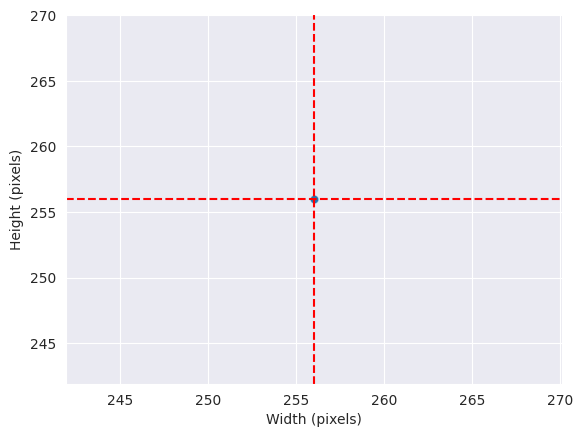

Width average: 256 
Height average: 256


In [8]:
"""
This code was written by me but was inspired by the methods used in the malaria detector project.
"""

dim1, dim2 = zip(*[(img.shape[0], img.shape[1]) for label in labels for img in [imread(os.path.join(train_path, label, image_filename)) for image_filename in os.listdir(os.path.join(train_path, label))]])

sns.set_style("darkgrid")
fig, axes = plt.subplots()
sns.scatterplot(x=dim2, y=dim1, alpha=0.2)
axes.set_xlabel("Width (pixels)")
axes.set_ylabel("Height (pixels)")
dim1_mean = int(sum(dim1)/len(dim1))
dim2_mean = int(sum(dim2)/len(dim2))
axes.axvline(x=dim2_mean, color='r', linestyle='--')
axes.axhline(y=dim1_mean, color='r', linestyle='--')
plt.show()

print(f"Width average: {dim2_mean} \nHeight average: {dim1_mean}")

In [9]:
image_shape = (dim1_mean, dim2_mean, 3)
image_shape

(256, 256, 3)

In [10]:
joblib.dump(value=image_shape ,
            filename=f"{file_path}/image_shape.pkl")

['outputs/v1/image_shape.pkl']

---

# Load images into an array

In [11]:
"""
This function was written by the Code institute team in the malaria detector project,
this was an efficient way of loading the images into an array

For the purpose of showing my understanding of the code, below i've written what the function does in detail.

1. The function initializes two empty NumPy arrays X and y to hold the images and their labels, respectively. The data type of y is set to object because the labels can be strings of varying lengths.

2 The function obtains a list of labels from the my_data_dir directory using the os.listdir() function.

3 The function iterates over each label in labels, and then iterates over each image in the corresponding subdirectory of my_data_dir. The counter variable is used to limit the number of images per label to n_images_per_label.

4. For each image, the function uses the image.load_img() function from the tensorflow.keras.preprocessing.image module to load the image as a PIL image. The target_size argument resizes the image to new_size, by default.

5. The function then checks whether the maximum pixel value in the image array is greater than 1. If so, it rescales the image array to have pixel values between 0 and 1 by dividing by 255. This is necessary because some image files may have pixel values outside the range [0, 255], which can cause problems when training machine learning models.

6. The image array is appended to the X array, and its label is appended to the y array. The reshape() function is used to ensure that the X array has the correct shape for a batch of images, which is (batch_size, height, width, channels). The batch_size is determined based on the number of images that have been loaded so far.

7. The function returns the X and y arrays.
"""

from tensorflow.keras.preprocessing import image


def load_image_as_array(my_data_dir, new_size=(50, 50), n_images_per_label=20):

    X, y = np.array([], dtype='int'), np.array([], dtype='object')
    labels = os.listdir(my_data_dir)

    for label in labels:
        counter = 0
        for image_filename in os.listdir(my_data_dir + '/' + label):
            # n_images_per_label: we set a limit, since it may take too much time
            if counter < n_images_per_label:

                img = image.load_img(
                    my_data_dir + '/' + label + '/' + image_filename, target_size=new_size)
                if image.img_to_array(img).max() > 1:
                    img_resized = image.img_to_array(img) / 255
                else:
                    img_resized = image.img_to_array(img)

                X = np.append(X, img_resized).reshape(-1,
                                                      new_size[0], new_size[1], img_resized.shape[2])
                y = np.append(y, label)
                counter += 1

    return X, y


In [12]:
X, y = load_image_as_array(my_data_dir=train_path,
                           new_size=image_shape,
                           n_images_per_label=30)
print(X.shape, y.shape)

(60, 256, 256, 3) (60,)


---

# Plot and save mean and variability of images per label

In [13]:
"""
This function was written by the Code institute team in the malaria detector project,
this was an efficient way of plotting the images average and standard deviation separated by label. 

For the purpose of showing my understanding of the code, below i've written what the function does in detail.

1. The function loops through each unique label in y.

2. For each label, the function creates a boolean mask that selects all the images in X that belong to that label.

3. The function uses the boolean mask to create a new array arr that contains all the images in X that belong to the current label.

4. The function computes the average image for the current label by taking the mean of the arr array along the first axis (axis=0).

5. The function computes the variability image for the current label by taking the standard deviation of the arr array along the first axis (axis=0).

6. The function creates a new figure with subplots using plt.subplots(nrows=1, ncols=2, figsize=figsize).

7. The function displays the average image and the variability image on the two subplots

8. The function saves the figure to a file if save_image is True, using plt.savefig(). If save_image is False, the function displays the figure.

9. The function prints some information about the current label, such as the image shape and the label value.

10. The function repeats this process for each unique label in y.
"""

def plot_mean_variability_per_labels(X, y, figsize=(12, 5), save_image=False):


    for label_to_display in np.unique(y):
        sns.set_style("white")

        y = y.reshape(-1, 1, 1)
        boolean_mask = np.any(y == label_to_display, axis=1).reshape(-1)
        arr = X[boolean_mask]

        avg_img = np.mean(arr, axis=0)
        std_img = np.std(arr, axis=0)
        print(f"==== Label {label_to_display} ====")
        print(f"Image Shape: {avg_img.shape}")
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=figsize)
        axes[0].set_title(f"Average image for label {label_to_display}")
        axes[0].imshow(avg_img, cmap='gray')
        axes[1].set_title(f"Variability image for label {label_to_display}")
        axes[1].imshow(std_img, cmap='gray')

        if save_image:
            plt.savefig(f"{file_path}/avg_var_{label_to_display}.png",
                        bbox_inches='tight', dpi=150)
        else:
            plt.tight_layout()
            plt.show()
            print("\n")


==== Label healthy ====
Image Shape: (256, 256, 3)
==== Label powdery_mildew ====
Image Shape: (256, 256, 3)


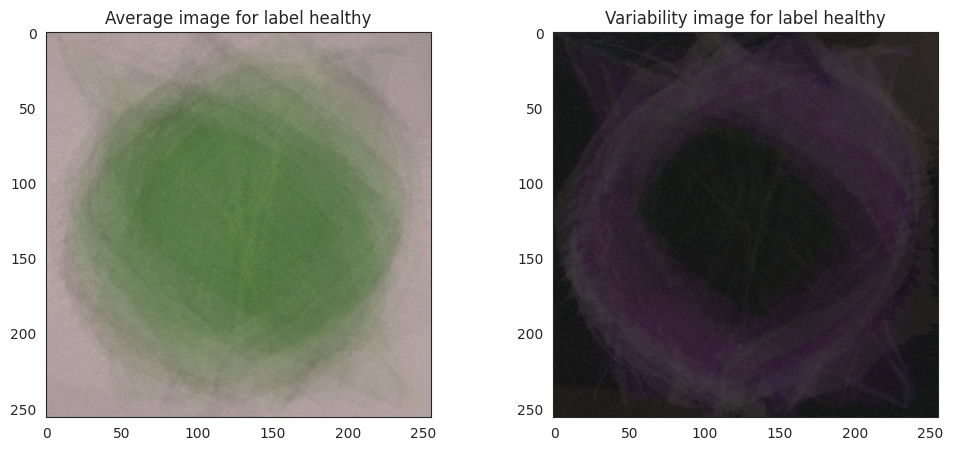

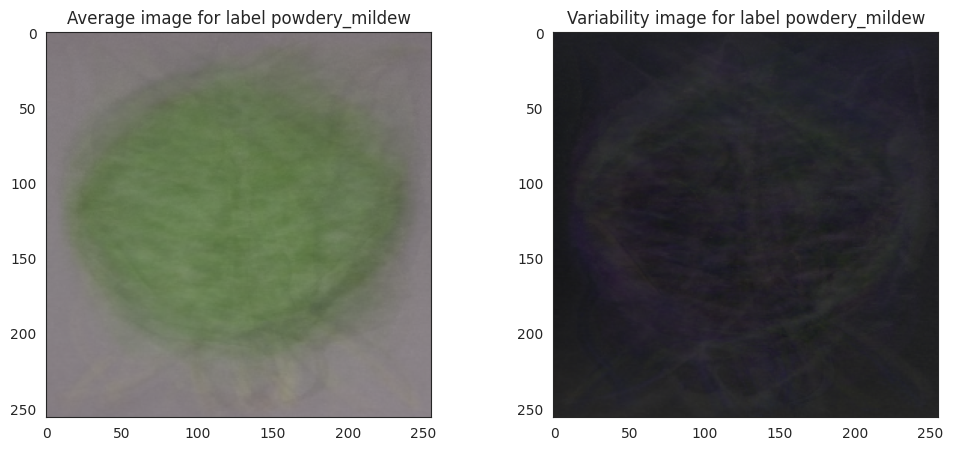

In [14]:
plot_mean_variability_per_labels(X=X, y=y, figsize=(12, 5), save_image=True)

---

# Calculate average difference between healthy leaf and one that's infected with powdery mildew.

In [15]:
"""
This function was written by the Code institute team in the malaria detector project,
this was an efficient way of plotting the difference between healthy and unhealthy leaves. 

For the purpose of showing my understanding of the code, below i've written what the function does in detail.

1. This code defines two functions, subset_image_label and diff_bet_avg_image_labels_data_as_array.

2. The subset_image_label function takes in the image data array X and the corresponding label array y, and a label_to_display argument that specifies the correct label. It then subsets the images in X that have a corresponding label matching label_to_display, and returns a new array of the subset of images.

3. The diff_bet_avg_image_labels_data_as_array function takes in the same image data array X and label array y, as well as two label arguments, label_1 and label_2. It then calculates the average image for both label_1 and label_2, and subtracts the two averages to produce the differences between them. Finally, the function plots the average image for both labels and the difference image side-by-side.
"""

# define the subset_image_label function
def subset_image_label(X, y, label_to_display):
    y = y.reshape(-1, 1, 1)
    boolean_mask = np.any(y == label_to_display, axis=1).reshape(-1)
    df = X[boolean_mask]
    return df

# define the diff_bet_avg_image_labels_data_as_array function
def diff_bet_avg_image_labels_data_as_array(X, y, label_1, label_2, figsize=(20, 5), save_image=False, file_path=file_path):
    """
    Checks if the labels exist in the set of unique labels
    Calculates the mean and difference for label1 and label2
    Plots a chart and saves it if save_image=True
    """
    sns.set_style("white")

    if (label_1 not in np.unique(y)) or (label_2 not in np.unique(y)):
        print(
            f"Either label {label_1} or label {label_2}, are not in {np.unique(y)} ")
        return

    # calculate mean from label1
    images_label = subset_image_label(X, y, label_1)
    label1_avg = np.mean(images_label, axis=0)

    # calculate mean from label2
    images_label = subset_image_label(X, y, label_2)
    label2_avg = np.mean(images_label, axis=0)

    # calculate difference and plot difference, avg label1 and avg label2
    difference_mean = label1_avg - label2_avg
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=figsize)
    axes[0].imshow(label1_avg, cmap='gray')
    axes[0].set_title(f'Average {label_1}')
    axes[1].imshow(label2_avg, cmap='gray')
    axes[1].set_title(f'Average {label_2}')
    axes[2].imshow(difference_mean, cmap='gray')
    axes[2].set_title(f'Difference image: Avg {label_1} & {label_2}')
    if save_image:
        plt.savefig(f"{file_path}/avg_diff.png", bbox_inches='tight', dpi=150)
    else:
        plt.tight_layout()
        plt.show()



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


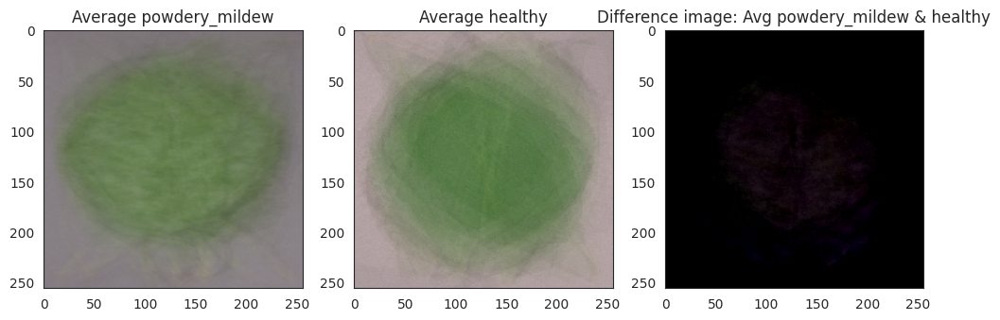

In [16]:
diff_bet_avg_image_labels_data_as_array(X=X, y=y,
                                        label_1='powdery_mildew', label_2='healthy',
                                        figsize=(12, 10),
                                        save_image=True
                                        )

---

# Image Montage

In [24]:
"""
This code was written by me but was inspired by the methods used in the malaria detector project,
namely the image montage function used in that project.
"""

import itertools
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os
import seaborn as sns


def image_montage(dir_path, label_to_display, nrows, ncols, figsize=(15, 10)):
    """
    if the label exists in the directory
    check if your montage space is greater than the subset size
    create a list of axes indices based on nrows and ncols
    create a Figure and display images
    in this loop, load and plot the given image
    """

    labels = os.listdir(dir_path)

    # subset the class you are interested to display
    if label_to_display in labels:

        # check the number of images in the subset
        images_list = os.listdir(os.path.join(dir_path, label_to_display))
        num_images = len(images_list)
        if num_images == 0:
            print(f"No images found for label {label_to_display}.")
            return

        # determine the number of images to display
        num_images_to_display = min(nrows * ncols, num_images)

        # randomly select a subset of images to display
        img_idx = random.sample(images_list, num_images_to_display)

        # create a list of axes indices based on nrows and ncols
        list_rows = range(nrows)
        list_cols = range(ncols)
        plot_idx = list(itertools.product(list_rows, list_cols))

        # create a Figure and display images
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
        for i, idx in enumerate(img_idx):
            img = imread(os.path.join(dir_path, label_to_display, idx))
            img_shape = img.shape
            ax = axes[plot_idx[i][0], plot_idx[i][1]]
            ax.imshow(img)
            ax.set_title(f"Width {img_shape[1]}px x Height {img_shape[0]}px")
            ax.set_xticks([])
            ax.set_yticks([])

        plt.tight_layout()
        plt.show()

    else:
        print("The label you selected doesn't exist.")
        print(f"The existing options are: {labels}")


healthy


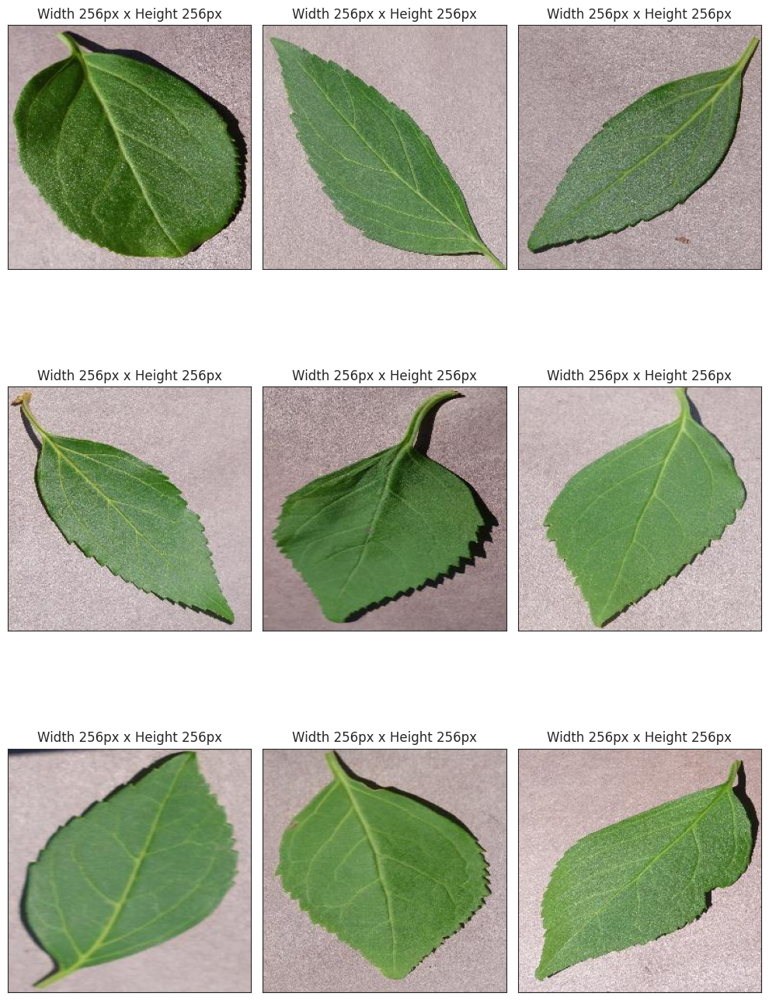



powdery_mildew


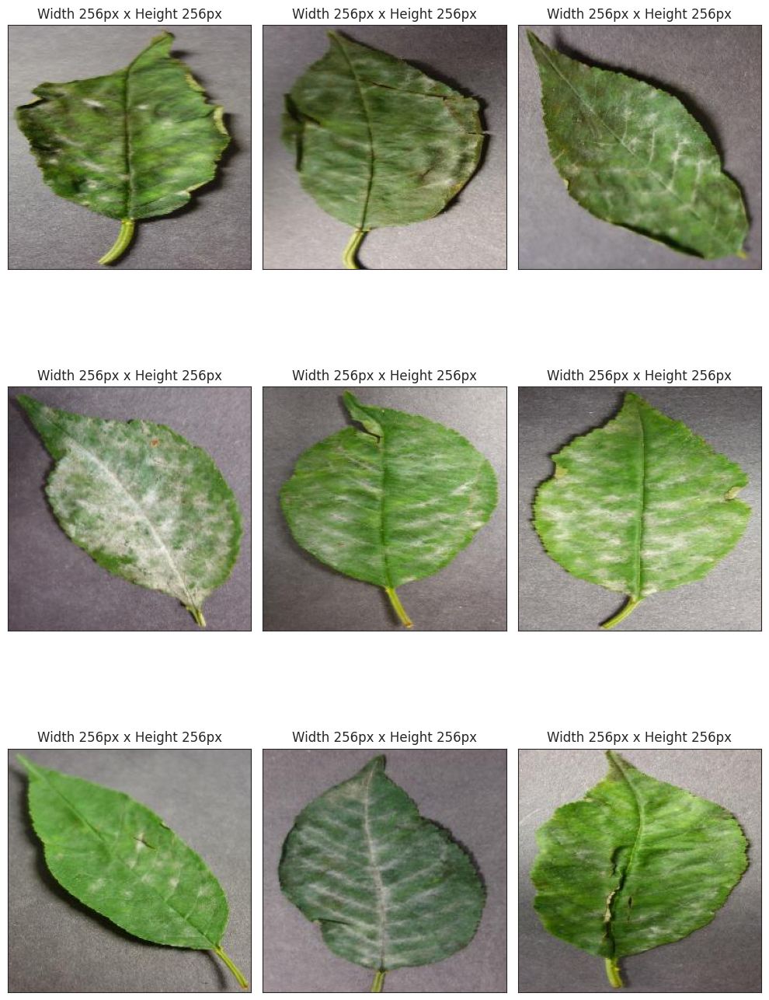

In [25]:
for label in labels:
    print(label)
    image_montage(dir_path=train_path,
                  label_to_display=label,
                  nrows=3, ncols=3,
                  figsize=(10, 15)
                  )
    print("\n")

---

# Conclusions

* The average and standard deviation images have been generated and saved to the outputs folder.
* the difference between an average healthy leaf and an average infected leaf have been saved to the outputs folder.
* the function for the image montage has been created.
* Business requirement 1 has been fulfilled.